# Agarwal 2021 - Normalization 
<div class="alert alert-warning">

**What this notebook does**

Data should be normalized in order to compare cells because counts are affected by sequencing depth, gene length and cell cycle phase.
<br>

In this notebook the different sample count tables of Agarwal et. al. are normalized. The data used has already been filtered.

<br>
Standard:
Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells. Then these normalized values are log-normalized to lower the significance of outliers.
<br>

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import anndata as ad
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#filtered doublets
path='/home/hers_basak/jjiang/jack/outputs/deliverables/2_filtering/data/filtered_'
suffix='base'
atlas='agarwal'
GSM4157068=f'{path}{atlas}_{suffix}_GSM4157068.h5ad'
GSM4157069=f'{path}{atlas}_{suffix}_GSM4157069.h5ad'
GSM4157070=f'{path}{atlas}_{suffix}_GSM4157070.h5ad'
GSM4157072=f'{path}{atlas}_{suffix}_GSM4157072.h5ad'
GSM4157074=f'{path}{atlas}_{suffix}_GSM4157074.h5ad'
GSM4157076=f'{path}{atlas}_{suffix}_GSM4157076.h5ad'
GSM4157078=f'{path}{atlas}_{suffix}_GSM4157078.h5ad'


In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/3_normalization'

In [6]:
!ls data

processed_agarwal_base_GSM4157068.h5ad
processed_agarwal_base_GSM4157068_reg.h5ad
processed_agarwal_base_GSM4157069.h5ad
processed_agarwal_base_GSM4157069_reg.h5ad
processed_agarwal_base_GSM4157070.h5ad
processed_agarwal_base_GSM4157070_reg.h5ad
processed_agarwal_base_GSM4157072.h5ad
processed_agarwal_base_GSM4157072_reg.h5ad
processed_agarwal_base_GSM4157074.h5ad
processed_agarwal_base_GSM4157074_reg.h5ad
processed_agarwal_base_GSM4157076.h5ad
processed_agarwal_base_GSM4157076_reg.h5ad
processed_agarwal_base_GSM4157078.h5ad
processed_agarwal_base_GSM4157078_reg.h5ad
processed_altena_base_g004.h5ad
processed_altena_base_g004_reg.h5ad
processed_altena_base_g005.h5ad
processed_altena_base_g005_reg.h5ad
processed_altena_base_g011.h5ad
processed_altena_base_g011_reg.h5ad
processed_altena_base_g012.h5ad
processed_altena_base_g012_reg.h5ad
processed_altena_base_g013.h5ad
processed_altena_base_g013_reg.h5ad
processed_altena_base_g014.h5ad
processed_altena_base_g014_reg.h5ad
processed_altena_b

In [7]:
files = [GSM4157068,GSM4157069,GSM4157070,GSM4157072,GSM4157074,GSM4157076,GSM4157078]

In [8]:
names = [name.split('_agarwal_base_')[1].split('.h5ad')[0].replace("-", "_") for name in files ]
print(names)

['GSM4157068', 'GSM4157069', 'GSM4157070', 'GSM4157072', 'GSM4157074', 'GSM4157076', 'GSM4157078']


In [9]:
object_names_filtered=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered_1")
    locals()[object_names_filtered[i]] = sc.read(files[i]) 
    print(object_names_filtered[i],' is loaded')

adata_GSM4157068_filtered_1  is loaded
adata_GSM4157069_filtered_1  is loaded
adata_GSM4157070_filtered_1  is loaded
adata_GSM4157072_filtered_1  is loaded
adata_GSM4157074_filtered_1  is loaded
adata_GSM4157076_filtered_1  is loaded
adata_GSM4157078_filtered_1  is loaded


In [10]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]])

AnnData object with n_obs × n_vars = 1896 × 21541
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'
AnnData object with n_obs × n_vars = 1090 × 20023
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_to

## Normalization

In [18]:
print(locals()[object_names_filtered[1]].raw.X)

  (0, 2)	1
  (0, 9)	3
  (0, 11)	1
  (0, 12)	1
  (0, 14)	1
  (0, 16)	1
  (0, 20)	2
  (0, 21)	1
  (0, 22)	3
  (0, 24)	1
  (0, 25)	4
  (0, 28)	2
  (0, 30)	3
  (0, 31)	1
  (0, 46)	3
  (0, 47)	1
  (0, 48)	8
  (0, 51)	6
  (0, 52)	2
  (0, 53)	3
  (0, 54)	1
  (0, 55)	3
  (0, 63)	1
  (0, 64)	1
  (0, 70)	1
  :	:
  (1089, 18957)	1
  (1089, 19008)	1
  (1089, 19018)	1
  (1089, 19047)	1
  (1089, 19079)	1
  (1089, 19083)	1
  (1089, 19114)	1
  (1089, 19147)	1
  (1089, 19156)	1
  (1089, 19161)	1
  (1089, 19184)	1
  (1089, 19335)	1
  (1089, 19337)	1
  (1089, 19359)	1
  (1089, 19412)	1
  (1089, 19430)	1
  (1089, 19434)	1
  (1089, 19484)	1
  (1089, 19539)	1
  (1089, 19637)	1
  (1089, 19719)	1
  (1089, 19743)	2
  (1089, 19750)	1
  (1089, 19835)	1
  (1089, 19896)	1


In [15]:
## Normalize and Logarithmize
for i in range(numberobj):
    locals()[object_names_filtered[i]].raw = locals()[object_names_filtered[i]].copy()
    sc.pp.normalize_total(locals()[object_names_filtered[i]], key_added='total_counts_norm',target_sum=10000)
    sc.pp.log1p(locals()[object_names_filtered[i]])
    print(object_names_filtered[i], ' has been normalized and logarithmized')

adata_GSM4157068_filtered_1  has been normalized and logarithmized
adata_GSM4157069_filtered_1  has been normalized and logarithmized
adata_GSM4157070_filtered_1  has been normalized and logarithmized
adata_GSM4157072_filtered_1  has been normalized and logarithmized
adata_GSM4157074_filtered_1  has been normalized and logarithmized
adata_GSM4157076_filtered_1  has been normalized and logarithmized
adata_GSM4157078_filtered_1  has been normalized and logarithmized


### Identify highly-variable genes
This step is important to choose the feature that will be used for dimensionality reduction ()

In [19]:
for i in range(numberobj): 
    sc.pp.highly_variable_genes(locals()[object_names_filtered[i]], min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error
    print('worked')

worked
worked
worked
worked
worked
worked
worked


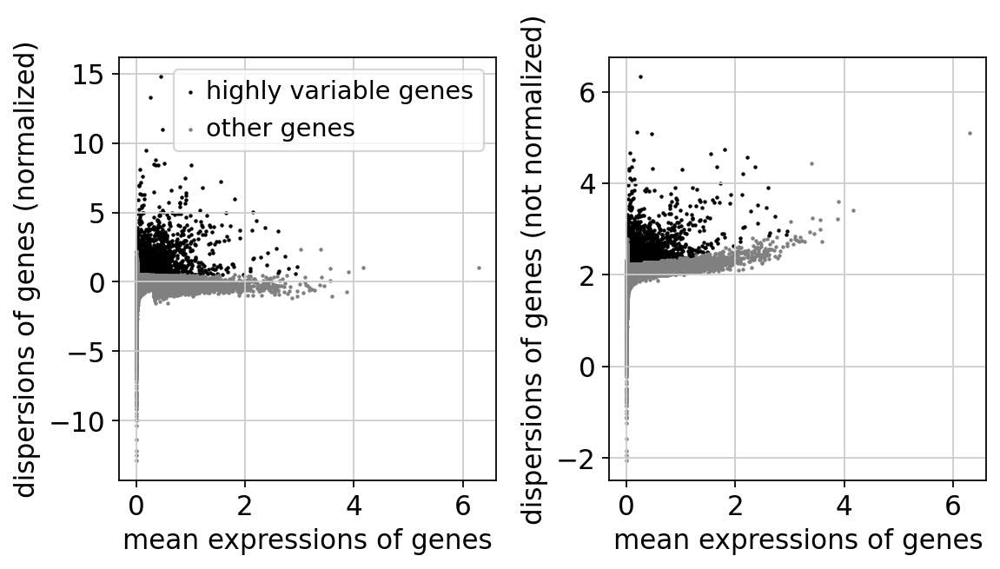

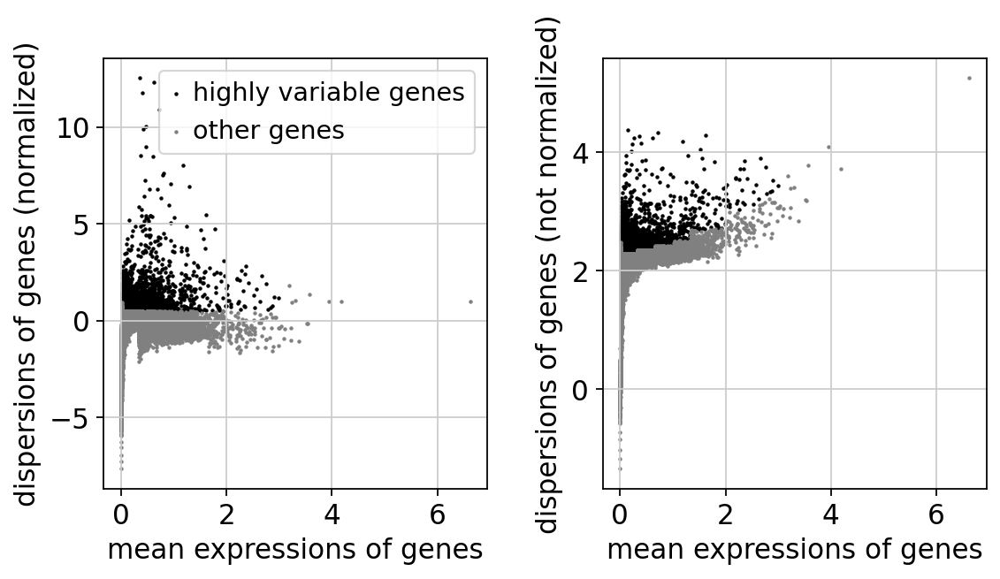

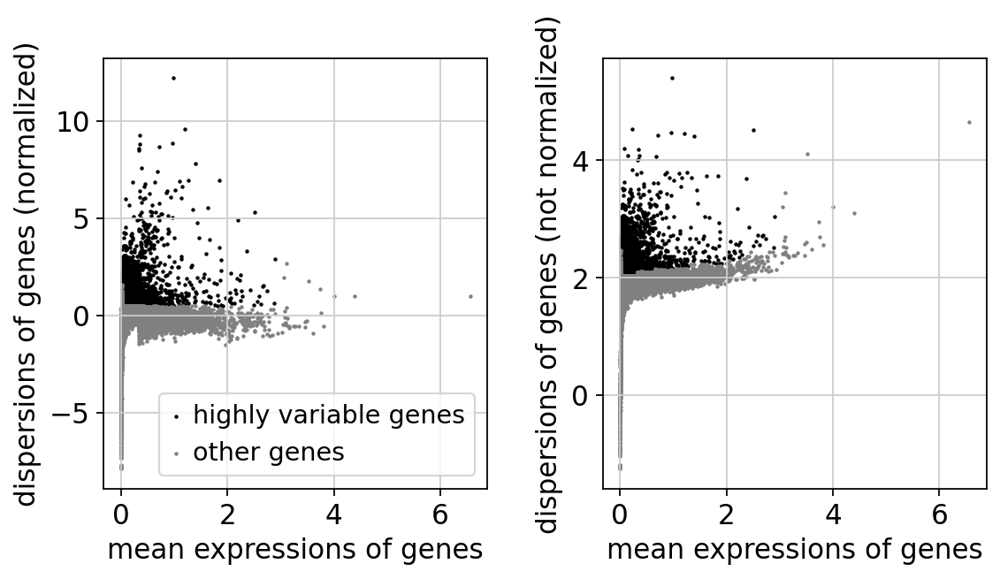

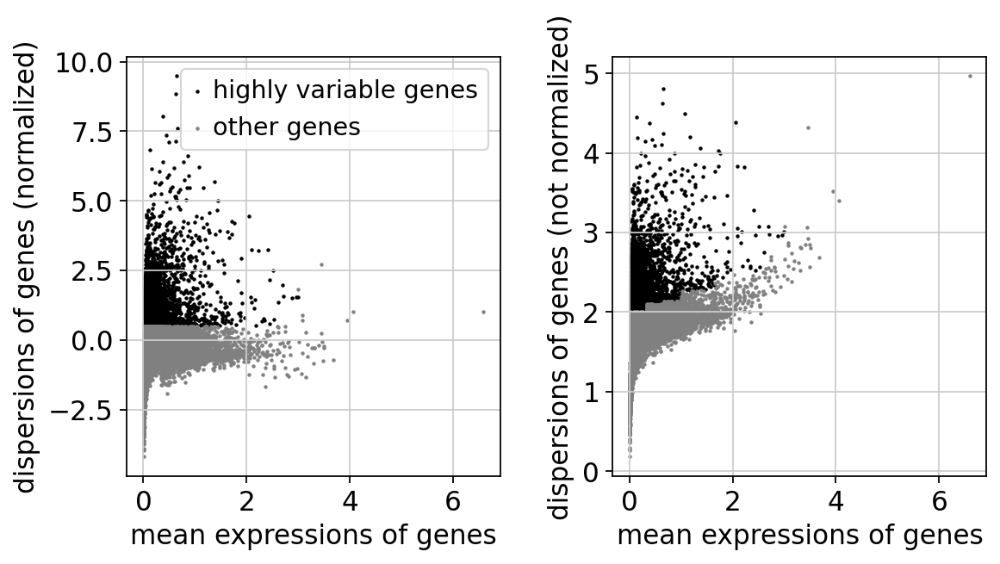

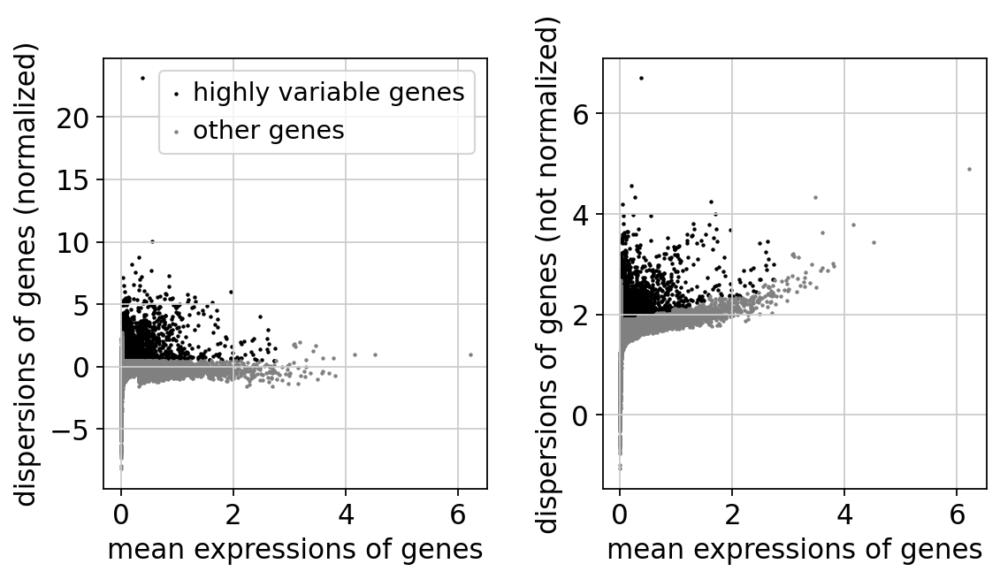

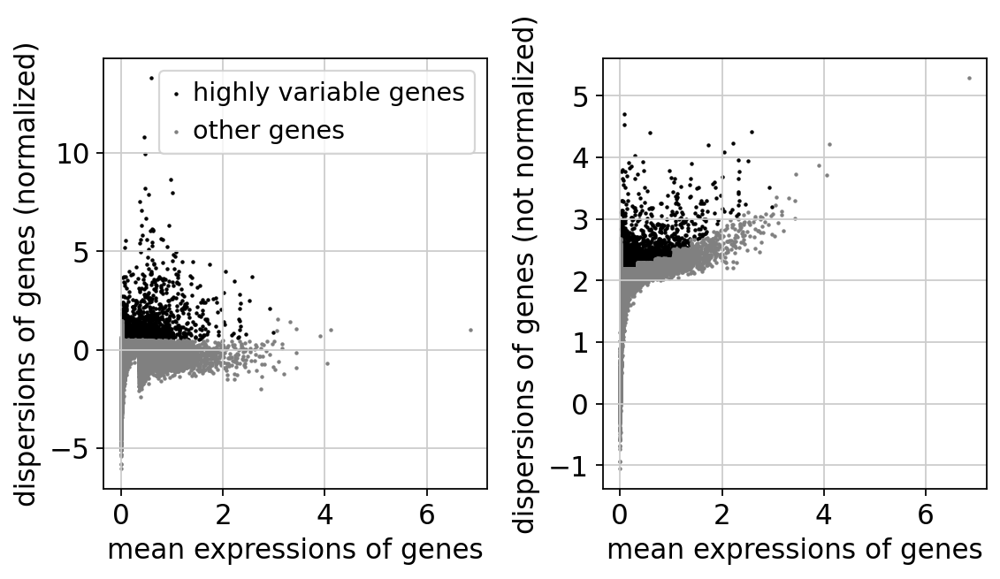

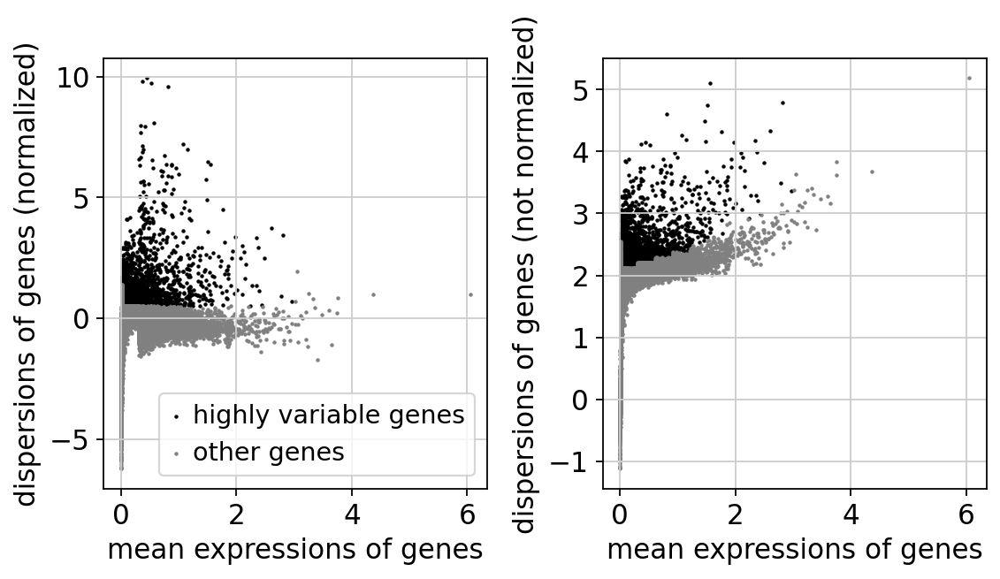

In [20]:
for i in range(numberobj): 
    sc.pl.highly_variable_genes(locals()[object_names_filtered[i]])

### regress and scale
We will compare data regressed for the number of counts and scaled to unprocessed data. It is better to do the least possible. This also saves from memory and disk space. Still, if the number of counts influence the embedding, we need to correct for this \
Note: You could skip filtering for highly variable genes only if you dont need to regress and scale
https://github.com/theislab/single-cell-tutorial/issues/35

In [21]:
for i in range(numberobj):
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]].copy()
    locals()[object_names_filtered[i]+"_reg"].raw = locals()[object_names_filtered[i]+"_reg"]
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]+"_reg"][:, locals()[object_names_filtered[i]+"_reg"].var['highly_variable']]
    sc.pp.regress_out(locals()[object_names_filtered[i]+"_reg"], ['total_counts']) # previously, we regreesed 'n_counts_filtered','percent_mito'
    sc.pp.scale(locals()[object_names_filtered[i]+"_reg"], max_value=10)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [22]:
object_names_reg = list()
numberobj = len(files)
for i in range(numberobj):
    object_names_reg.append(object_names_filtered[i]+"_reg")

In [23]:
object_names_reg

['adata_GSM4157068_filtered_1_reg',
 'adata_GSM4157069_filtered_1_reg',
 'adata_GSM4157070_filtered_1_reg',
 'adata_GSM4157072_filtered_1_reg',
 'adata_GSM4157074_filtered_1_reg',
 'adata_GSM4157076_filtered_1_reg',
 'adata_GSM4157078_filtered_1_reg']

# Dimensional Reduction

In [24]:
#To make reproducible plots
np.random.seed(41)

### Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [25]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_filtered[i]], svd_solver='arpack')
    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

GSM4157068


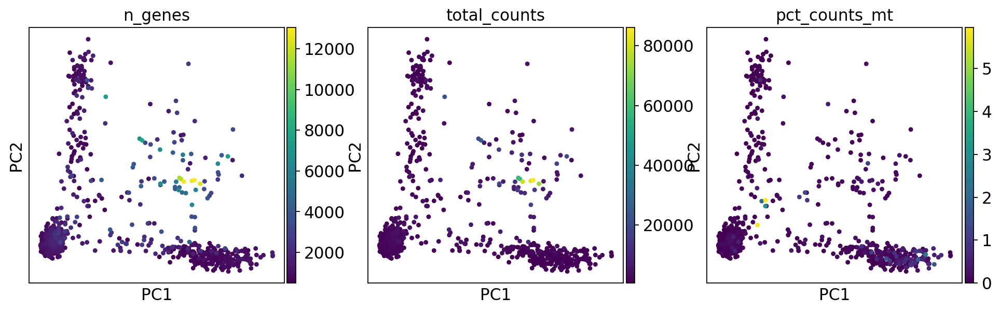

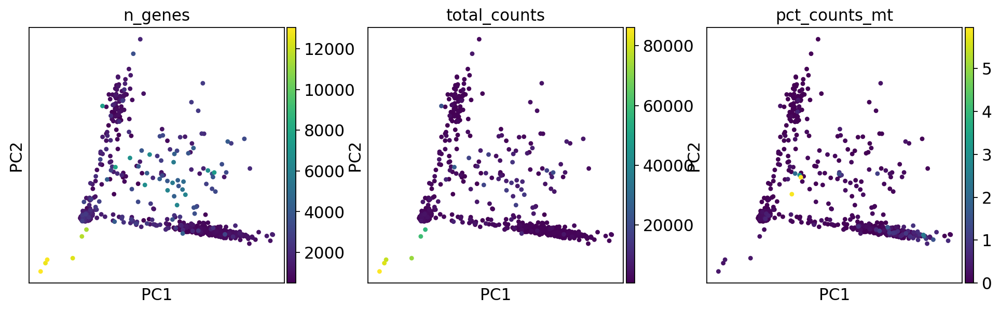

GSM4157069


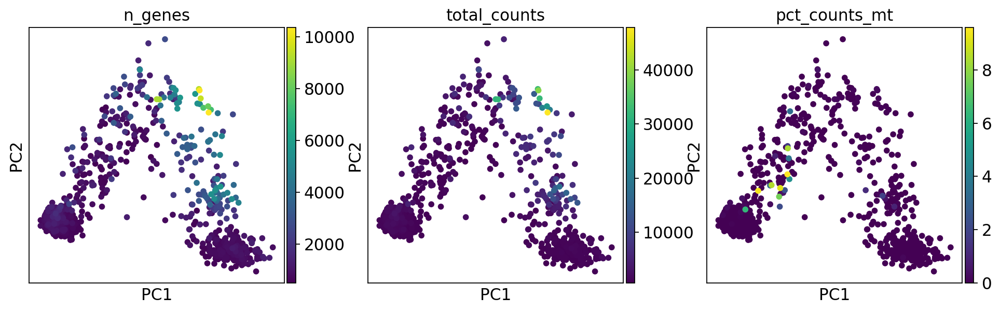

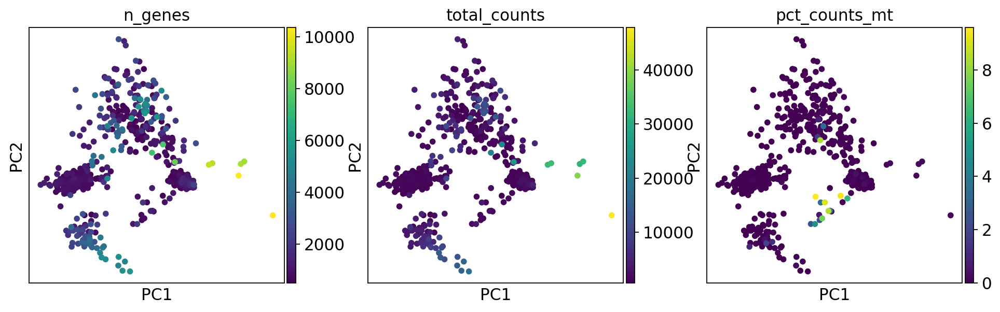

GSM4157070


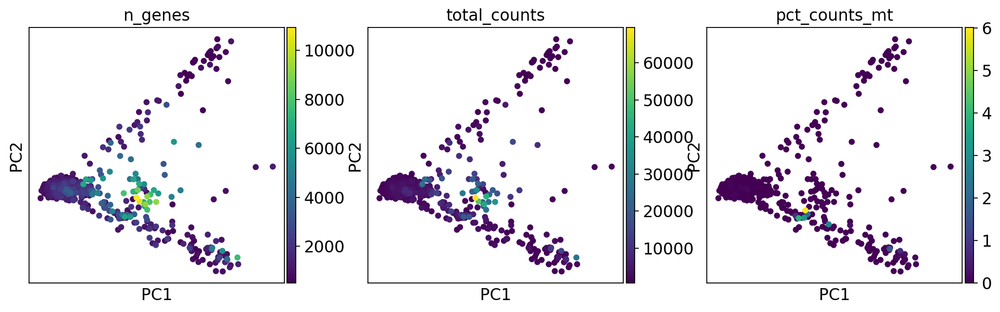

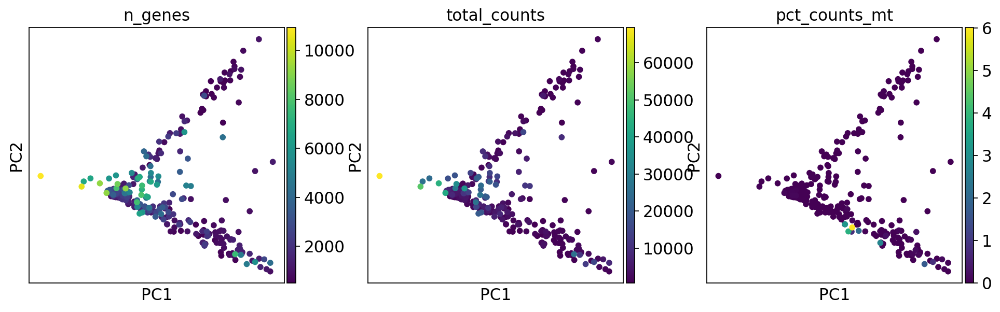

GSM4157072


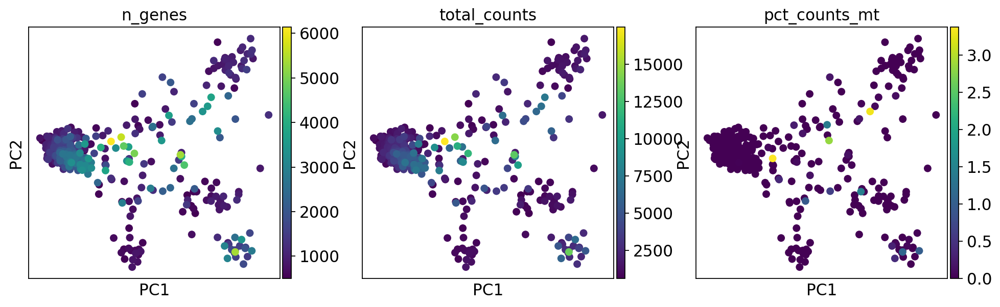

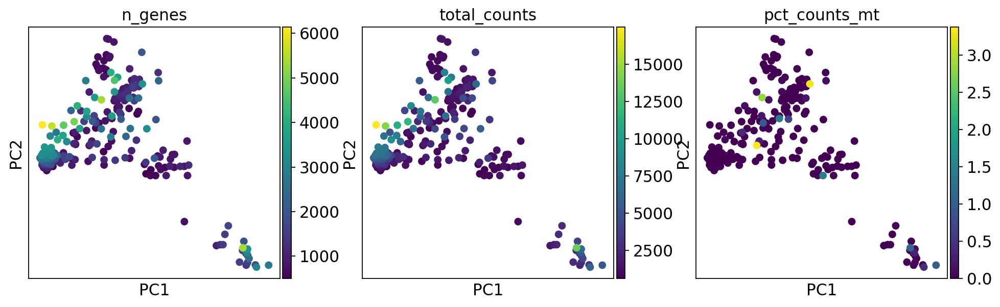

GSM4157074


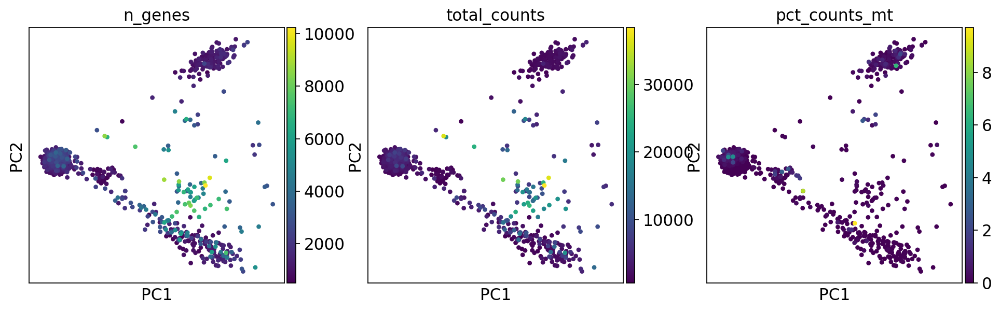

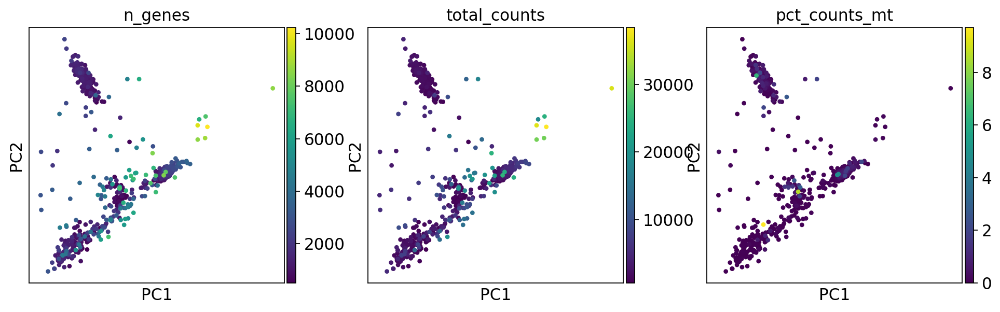

GSM4157076


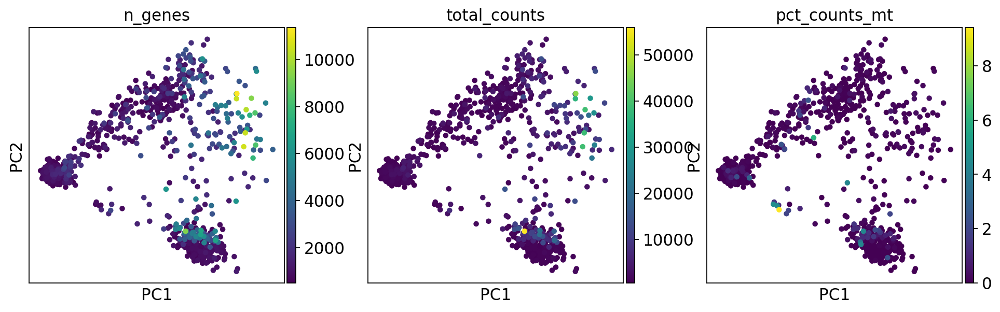

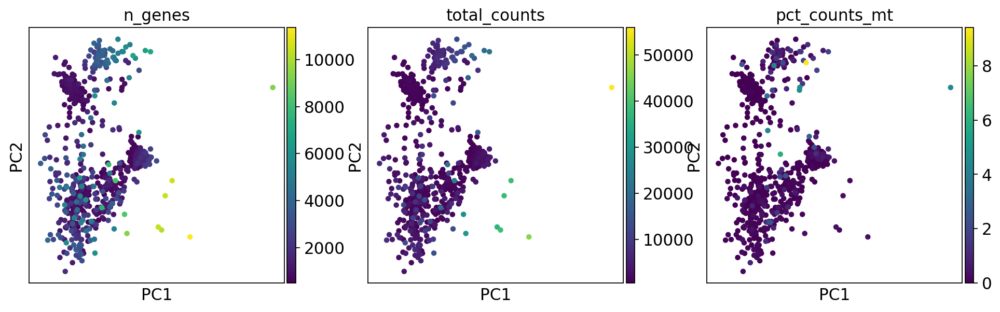

GSM4157078


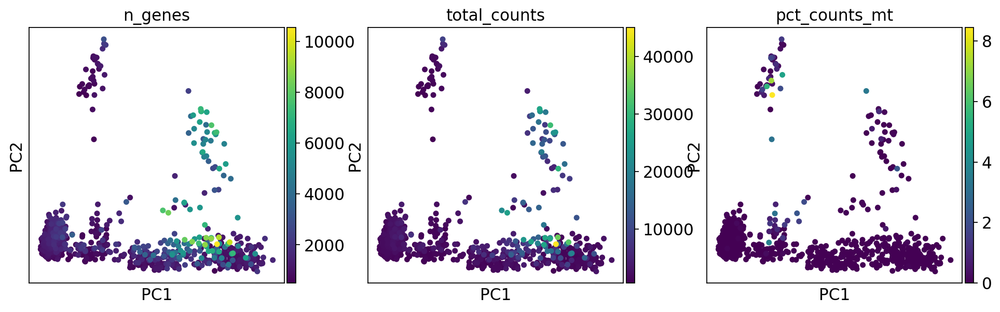

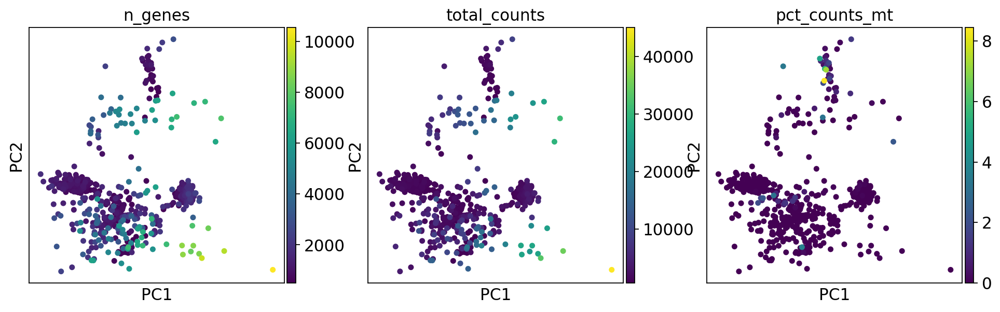

In [26]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_filtered[i]+"_pca.pdf")
    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


**Visualizing cells with marker genes:**<br>
Gfap: Astrocytes <br>
Plp1: myelin proteolipid protein, oligodendritic glial sheaths<br>
Rbfox3: post-mitotic neurons<br>
Gad1: GABAergic neuronal marker (extrasynaptic and metabolic purposes)<br>
Gad2: GABAergic neuronal marker (regulate vesicular pool for release)<br>
Slc17a6: glutamatergic neurons (with Th colocalize VTA)<br>
Th: Dopaminergic neurons<br>
Pecam1: Endothelial cells<br>
P2ry12: Microglia<br>

In [ ]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1','TMEM119'])
                  #,save = "_"+object_names_filtered[i]+"_pca_markers.pdf") # title =object_names[i],
        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'])
        #,save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ])
        #,save = "_"+object_names_filtered[i]+"_pca_markers.pdf") #title =object_names_reg[i], 
#        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


Seems like taking only highly variable genes tends to cluster everything together -> maybe due to outliers

### UMAP

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. \
We will run the following for quick analyses. Later, we will use some metrics to fing out the best dimensionality reduction parameters for UMAP and t-SNE. This is best done on merged datasets

In [28]:
 for i in range(numberobj):
    nn = int(np.sqrt(len(locals()[object_names_filtered[i]])/2))
    print(nn)

30
23
23
18
31
25
24


In [29]:
nn= 15 #default 15
for i in range(numberobj):
    sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn, n_pcs=40)
    sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_filtered[i]])
    sc.tl.umap(locals()[object_names_reg[i]])

GSM4157068


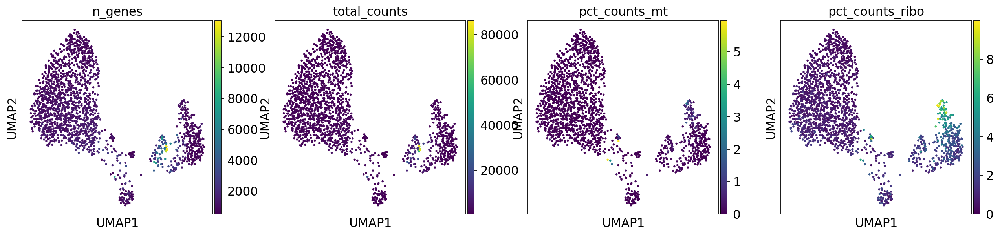

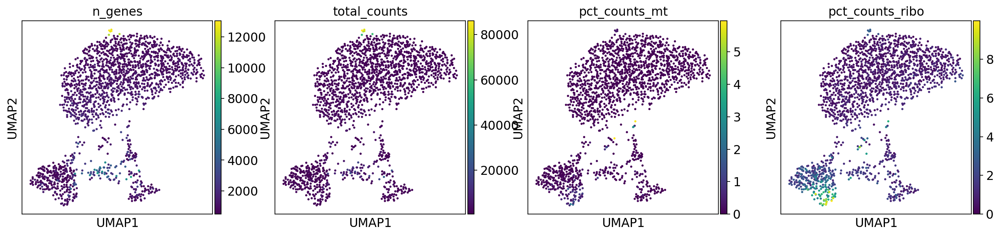

GSM4157069


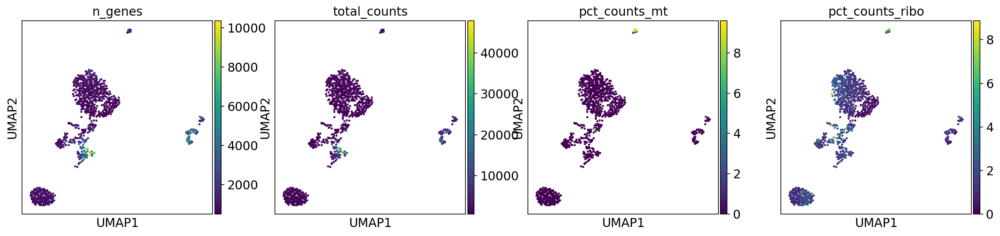

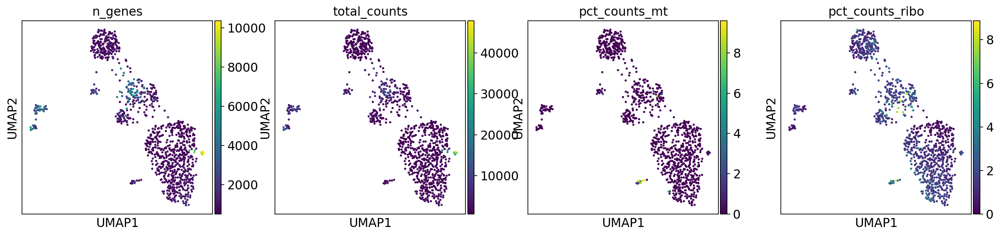

GSM4157070


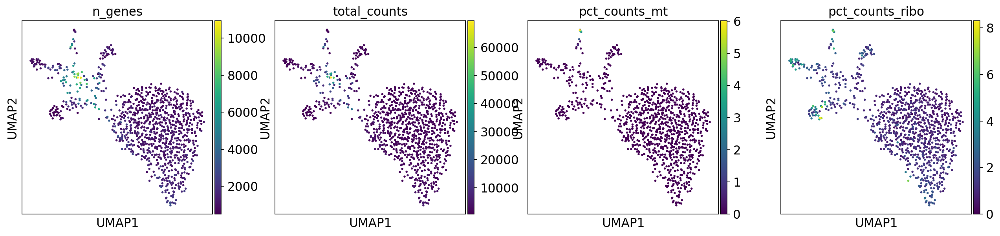

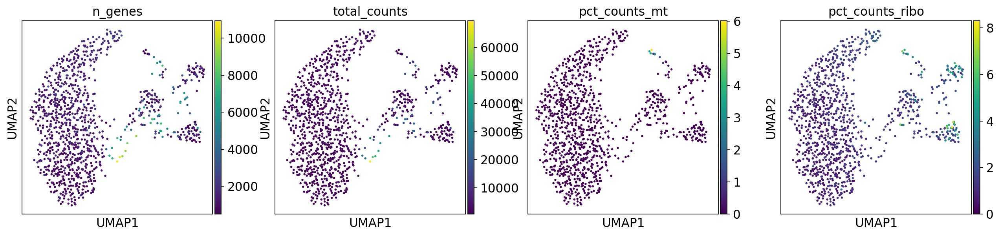

GSM4157072


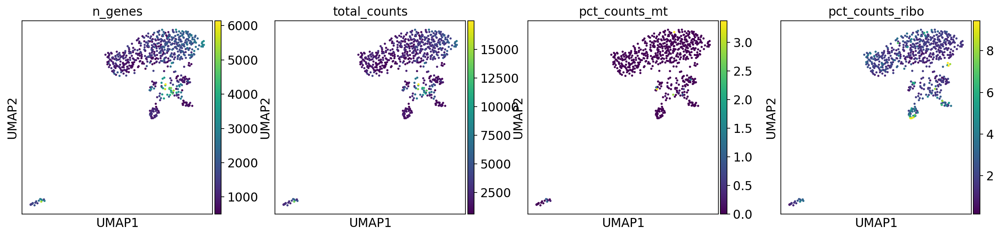

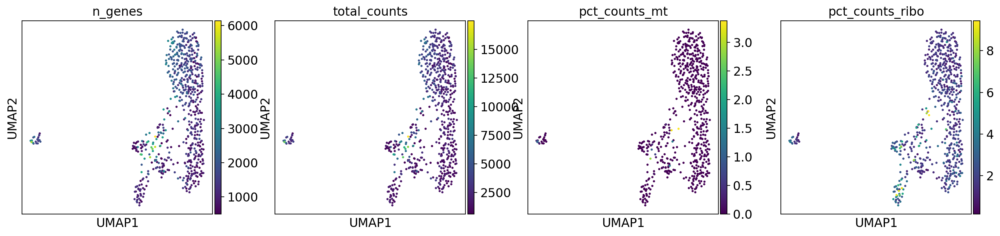

GSM4157074


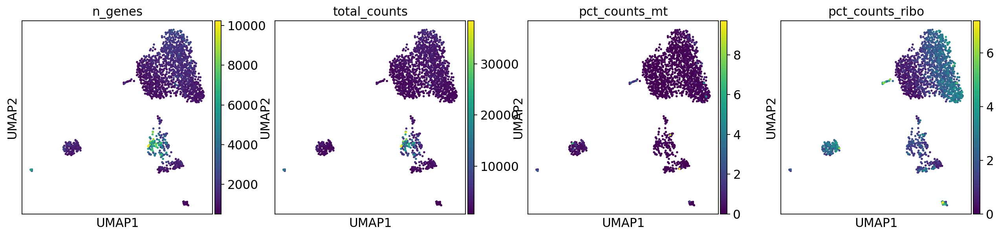

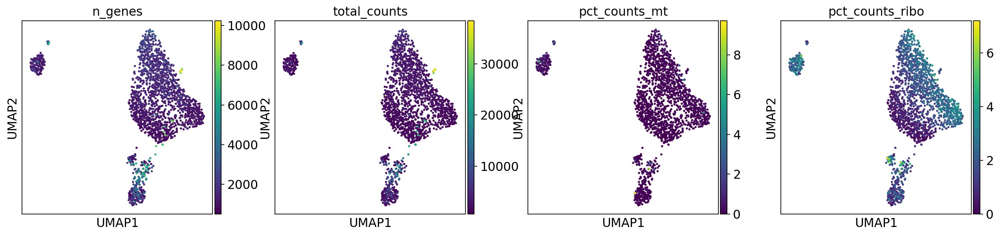

GSM4157076


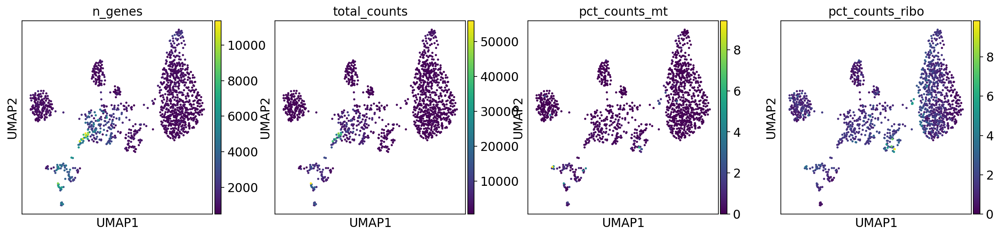

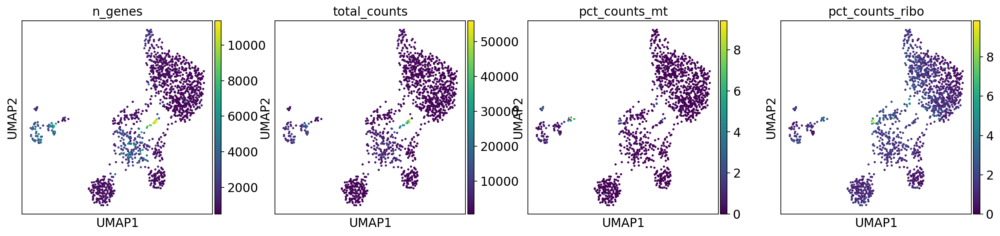

GSM4157078


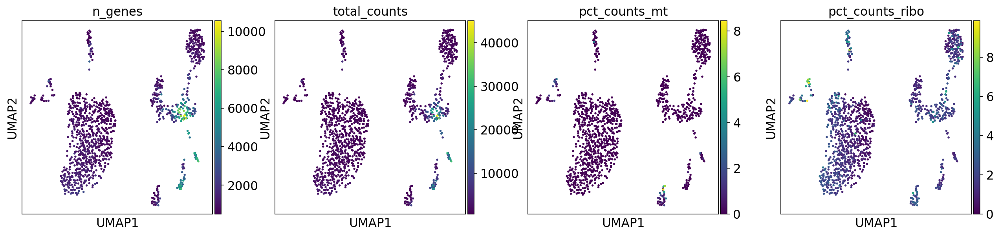

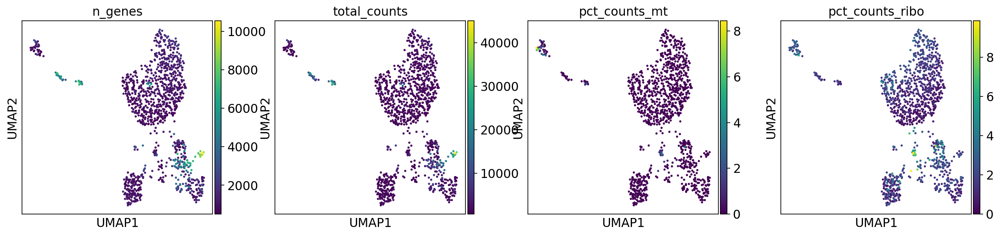

In [30]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=False, s=25)
           #,save = "_"+object_names_filtered[i]+"_umap_n"+str(nn)+".pdf")
    sc.pl.umap(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=False, s=25)
         #,save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+".pdf")

### Plot with marker genes

GSM4157068


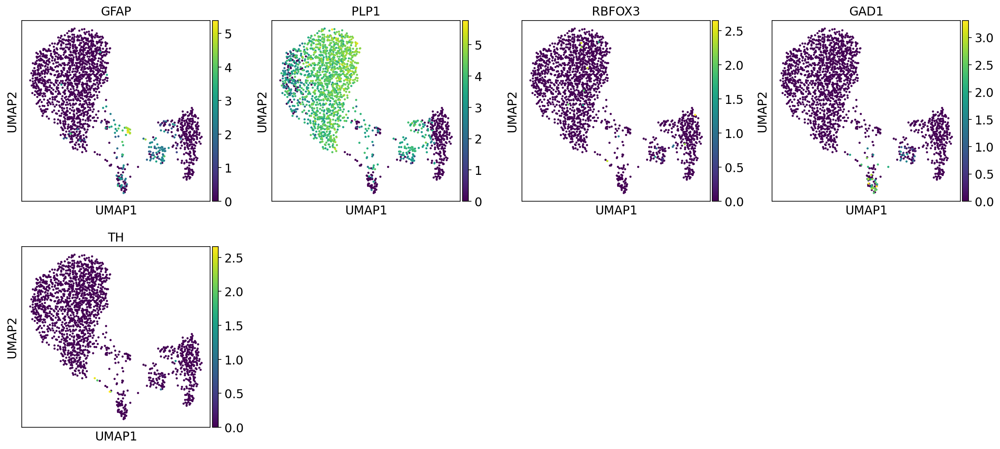

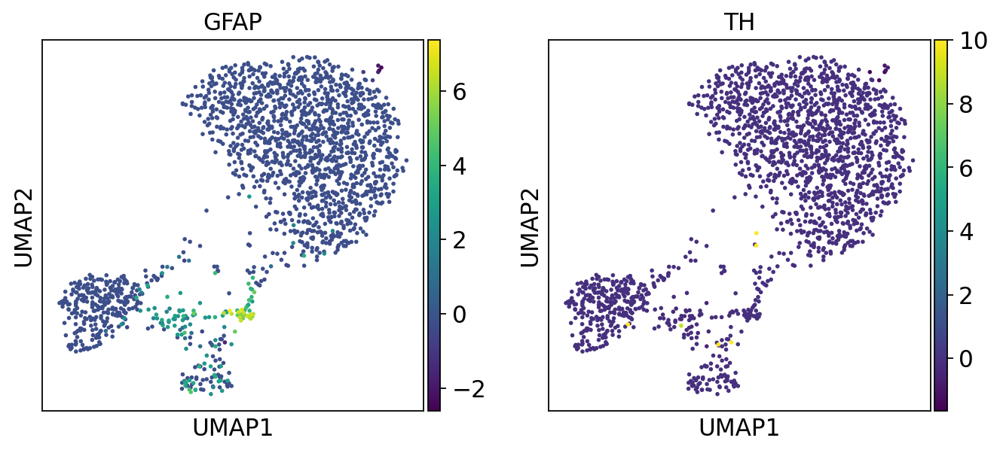

GSM4157069


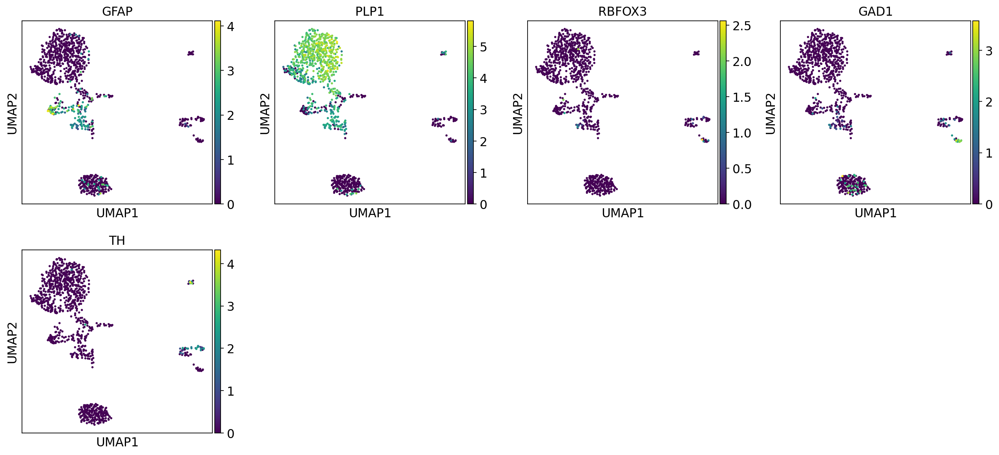

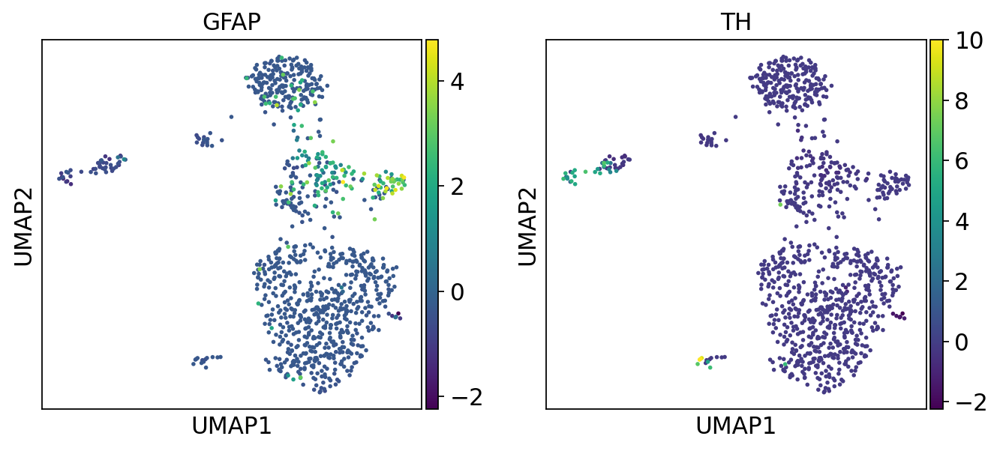

GSM4157070


KeyError: 'Could not find key TH in .var_names or .obs.columns.'

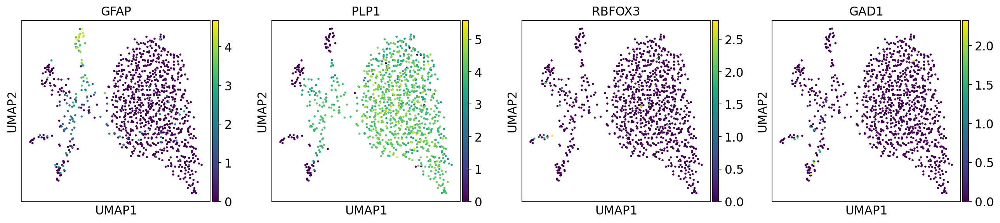

In [37]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1', 'TH'], use_raw=False, s=25)
                  #,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")
        sc.pl.umap(locals()[object_names_reg[i]], color=['GFAP', 'TH'], use_raw=False, s=25) #filters out 'RBFOX3','GAD1','SLC17A6'
    else:
        sc.pl.umap(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25)
                  #,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")

## Merge

In [38]:
adata_agarwal_merge=ad.concat([adata_GSM4157068_filtered_1, adata_GSM4157069_filtered_1, adata_GSM4157070_filtered_1, adata_GSM4157072_filtered_1, adata_GSM4157074_filtered_1, adata_GSM4157076_filtered_1, adata_GSM4157078_filtered_1],  join="outer", fill_value=0)

adata_agarwal_merge.obs_names_make_unique()


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [39]:
adata_agarwal_reg_merge=ad.concat([adata_GSM4157068_filtered_1_reg, adata_GSM4157069_filtered_1_reg, adata_GSM4157070_filtered_1_reg, adata_GSM4157072_filtered_1_reg, adata_GSM4157074_filtered_1_reg, adata_GSM4157076_filtered_1_reg, adata_GSM4157078_filtered_1_reg],  join="outer", fill_value=0)

adata_agarwal_merge.obs_names_make_unique()


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [41]:
adata_agarwal_merge

AnnData object with n_obs × n_vars = 9214 × 26174
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    obsm: 'X_pca', 'X_umap'

In [42]:
adata_agarwal_reg_merge

AnnData object with n_obs × n_vars = 9214 × 14961
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    obsm: 'X_pca', 'X_umap'

### Save
nn =15

In [43]:
print(object_names_filtered[i][6:].split('_filtered')[0])

GSM4157070


In [44]:
adata_agarwal_merge.write(os.path.join('./data/processed_agarwal_base_merge.h5ad'))
adata_agarwal_reg_merge.write(os.path.join('./data/processed_agarwal_base_merge_reg.h5ad'))

In [31]:
for i in range(numberobj):
    locals()[object_names_filtered[i]].write(os.path.join('./data/processed_agarwal_base_'+object_names_filtered[i][6:].split('_filtered')[0])+'.h5ad')
    locals()[object_names_reg[i]].write(os.path.join('./data/processed_agarwal_base_'+object_names_reg[i][6:].split('_filtered')[0])+'_reg.h5ad')

In [32]:
!ls data/

processed_agarwal_base_GSM4157068.h5ad
processed_agarwal_base_GSM4157068_reg.h5ad
processed_agarwal_base_GSM4157069.h5ad
processed_agarwal_base_GSM4157069_reg.h5ad
processed_agarwal_base_GSM4157070.h5ad
processed_agarwal_base_GSM4157070_reg.h5ad
processed_agarwal_base_GSM4157072.h5ad
processed_agarwal_base_GSM4157072_reg.h5ad
processed_agarwal_base_GSM4157074.h5ad
processed_agarwal_base_GSM4157074_reg.h5ad
processed_agarwal_base_GSM4157076.h5ad
processed_agarwal_base_GSM4157076_reg.h5ad
processed_agarwal_base_GSM4157078.h5ad
processed_agarwal_base_GSM4157078_reg.h5ad
processed_altena_base_g004.h5ad
processed_altena_base_g004_reg.h5ad
processed_altena_base_g005.h5ad
processed_altena_base_g005_reg.h5ad
processed_altena_base_g011.h5ad
processed_altena_base_g011_reg.h5ad
processed_altena_base_g012.h5ad
processed_altena_base_g012_reg.h5ad
processed_altena_base_g013.h5ad
processed_altena_base_g013_reg.h5ad
processed_altena_base_g014.h5ad
processed_altena_base_g014_reg.h5ad
processed_altena_b